# 2.6 Creating Dashboards with Python

## This script contains the following:
#### [1. Import Libraries](#import-libraries)
#### [2. Import Data](#import-data)
#### [3. Data Wrangling](#wrangling)
#### [4. Bar Chart](#barchart)
#### [5. Dual Axis Line Chart](#linechart)
#### [6. Export Dashboard Datasets](#export-data)

### 1. Import Libraries<a id='import-libraries'></a>

In [1]:
import streamlit as st
import pandas as pd
import numpy as np
import os
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from datetime import datetime as dt
from streamlit_keplergl import keplergl_static

### 2. Import Data<a id='import-data'></a>

In [334]:
folderpath = r'/Users/matthewjones/Documents/CareerFoundry/Data Visualization with Python/Achievement 2/NY-CitiBike/2. Data/Processed Data'

line_chart_data = pd.read_csv(os.path.join(folderpath, 'DB_line_chart_data.csv'))
bar_chart_start = pd.read_csv(os.path.join(folderpath, 'DB_bar_chart_start.csv'))
bar_chart_end = pd.read_csv(os.path.join(folderpath, 'DB_bar_chart_end.csv'))
hist_duration_data = pd.read_csv(os.path.join(folderpath, 'DB_hist_duration.csv'))
pie_payment_data = pd.read_csv(os.path.join(folderpath, 'DB_pie_payment.csv'))

In [335]:
line_chart_data = line_chart_data.drop(columns = {'Unnamed: 0'})
bar_chart_start = bar_chart_start.drop(columns = {'Unnamed: 0'})
bar_chart_end = bar_chart_end.drop(columns = {'Unnamed: 0'})
hist_duration_data = hist_duration_data.drop(columns = {'Unnamed: 0'})

In [260]:
line_chart_data.head()

,Date,Average Temperature,Daily Rides,Daily Classic Rides
0,2022-01-01,11.6,20428,11399
1,2022-01-02,11.4,43009,26857
2,2022-01-03,1.4,33189,19583
3,2022-01-04,-2.7,36842,22476
4,2022-01-05,3.2,34230,20676


In [261]:
bar_chart_start.head()

,start_station_name,rideable_type,season,Total,Grand Total
0,1 Ave & E 68 St,Classic Bike,Fall,14736,104856
1,1 Ave & E 68 St,Classic Bike,Spring,15016,104856
2,1 Ave & E 68 St,Classic Bike,Summer,19145,104856
3,1 Ave & E 68 St,Classic Bike,Winter,7940,104856
4,1 Ave & E 68 St,Electric Bike,Fall,14289,104856


In [262]:
bar_chart_end.head()

,end_station_name,rideable_type,season,Total,Grand Total
0,1 Ave & E 68 St,Classic Bike,Fall,14813,105121
1,1 Ave & E 68 St,Classic Bike,Spring,15068,105121
2,1 Ave & E 68 St,Classic Bike,Summer,19085,105121
3,1 Ave & E 68 St,Classic Bike,Winter,7786,105121
4,1 Ave & E 68 St,Electric Bike,Fall,14425,105121


In [336]:
hist_duration_data.head()

,trip_duration,value,member_casual,season,trip_duration_outliers
0,1295,1,Member,Winter,False
1,925,1,Casual,Winter,False
2,74,1,Member,Winter,False
3,1671,1,Member,Winter,False
4,267,1,Member,Winter,False


In [310]:
pie_payment_data.head()

,member_casual,value
0,Casual,6580665
1,Member,23257501


### 4. Bar Chart<a id='barchart'></a>
    Finding the top 20 stations by total number of trips started at each station

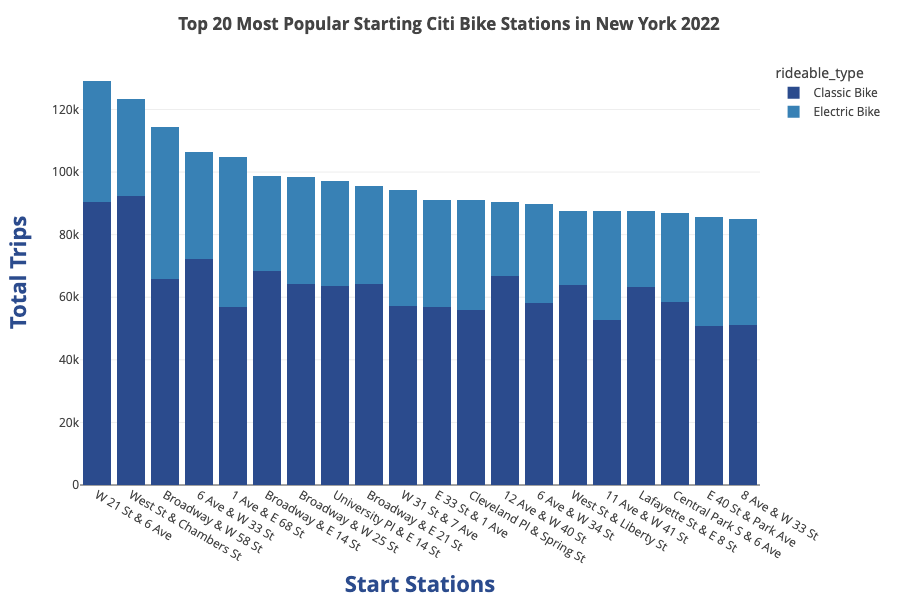

In [266]:
colors = ['#2B4B8D', '#3881B5']

# Initialize the plotly graph object with a bar chart
bar_start_fig = go.Figure(px.bar(bar_chart_start.sort_values('Grand Total', ascending=False),
                           x = 'start_station_name', 
                           y = 'Total', 
                           color = 'rideable_type',
                           barmode = 'stack',
                           color_discrete_sequence=colors)) ### Use a blue color palette based on the 'value' column

# Add titles to the chart
bar_start_fig.update_layout(
    title = '<b>Top 20 Most Popular Starting Citi Bike Stations in New York 2022</b>', ### <b></b> makes the titles bold
    xaxis_title = dict(text = '<b>Start Stations</b>', 
                        font = dict(size = 22, color = '#2B4B8D')),
    yaxis_title = dict(text = '<b>Total Trips</b>', 
                        font = dict(size = 22, color = '#2B4B8D')),
    width = 900, height = 600 ### Set the height and width of the chart area
)

bar_start_fig.update_xaxes(
    automargin = True ### Prevent the x-axis labels from overlapping with the x-axis title
)

bar_start_fig.show()

Recreated the same bar chart once made in matplotlib and seaborn, now using plotly. The plotly bar chart required less code to accomplish a similar output, and this is primarily because of plotly's inate interactivity. We did not have to code for the bar labels in this chart, plotly already displays those numbers on hover. Due to the dashboard being wider than tall, the bar chart was kept vertical, instead of the horizontal charts created before.

As with all the charts, we can see that W 21 St & 6 Ave is the most popular station. Of the top 20 start stations, most are in the most expensive neighborhoods of NYC (e.g. Chelsea, Upper East Side, Midtown, SoHo, Hell's Kitchen, etc.) And within these neighborhoods, most stations are near a popular tourist destination or park area (e.g. Central Park, Union Square, Madison Square Gardens/Penn Station, 9/11 Memorial, etc.) This would suggest the most common users of the bikes are commuters of a high socioeconomic status or tourists.

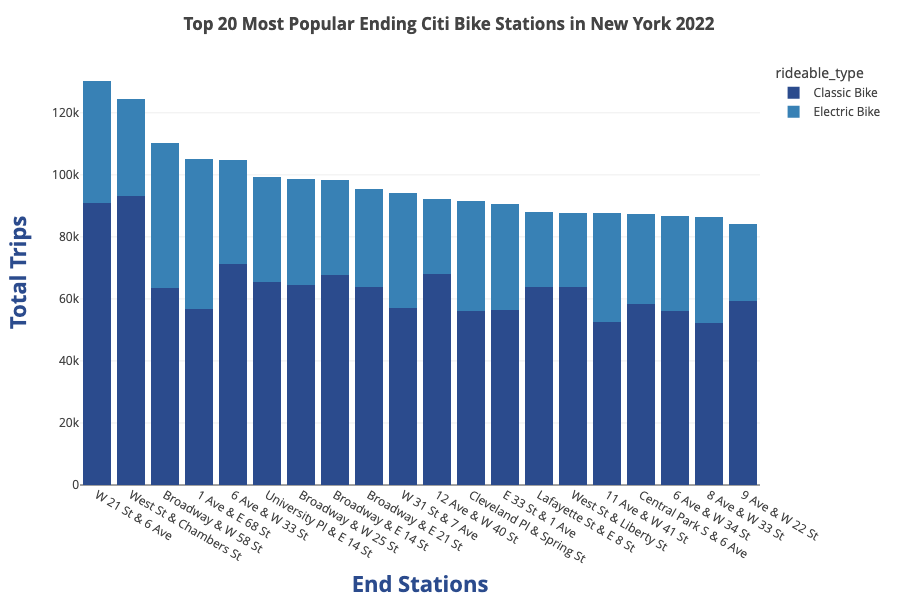

In [268]:
colors = ['#2B4B8D', '#3881B5']

# Initialize the plotly graph object with a bar chart
bar_end_fig = go.Figure(px.bar(bar_chart_end.sort_values(['Grand Total', 'rideable_type'], ascending=[False, True]),
                           x = 'end_station_name', 
                           y = 'Total', 
                           color = 'rideable_type',
                           barmode = 'stack',
                           color_discrete_sequence=colors)) ### Use a blue color palette based on the 'value' column

# Add titles to the chart
bar_end_fig.update_layout(
    title = '<b>Top 20 Most Popular Ending Citi Bike Stations in New York 2022</b>', ### <b></b> makes the titles bold
    xaxis_title = dict(text = '<b>End Stations</b>', 
                        font = dict(size = 22, color = '#2B4B8D')),
    yaxis_title = dict(text = '<b>Total Trips</b>', 
                        font = dict(size = 22, color = '#2B4B8D')),
    width = 900, height = 600 ### Set the height and width of the chart area
)

bar_end_fig.update_xaxes(
    automargin = True ### Prevent the x-axis labels from overlapping with the x-axis title
)

bar_end_fig.show()

### 5. Dual Axis Line Chart<a id='linechart'></a>
    Overlaying the total number of trips taken each day in 2022, with the average temperature of that day in NYC

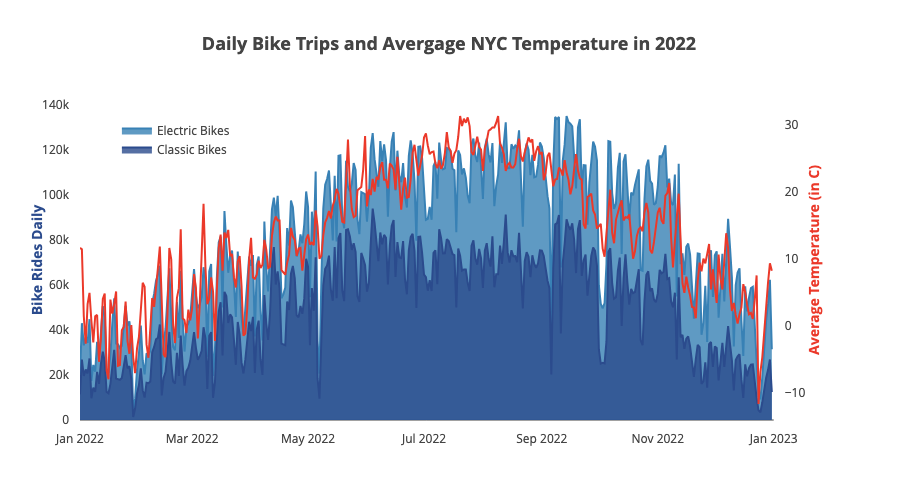

In [303]:
# Initialize the plotly graph object with a bar chart
line_fig = make_subplots(specs = [[{"secondary_y": True}]]) ### Set up the dual axis

# PRIMARY AXIS - Total bike rides
line_fig.add_trace(go.Scatter(x = line_chart_data['Date'], 
                         y = line_chart_data['Daily Rides'], 
                         fill = 'tozeroy', #fill down to xaxis
                         fillcolor = 'rgba(56, 129, 181, 0.8)',
                         mode = 'lines',
                         line = {'color': '#3881B5'},
                         name = 'Electric Bikes'),
                    secondary_y = False)

#Area chart for Urban Population from 1955 to 2020
line_fig.add_trace(go.Scatter(x = line_chart_data['Date'], 
                         y = line_chart_data['Daily Classic Rides'], 
                         fill = 'tozeroy', #fill down to xaxis
                         fillcolor = 'rgba(43, 75, 141, 0.8)',
                         mode = 'lines',
                         line = {'color': '#2B4B8D'},
                         name = 'Classic Bikes'),
              secondary_y = False)

# SECONDARY AXIS - Average temperature
line_fig.add_trace(
go.Scatter(x = line_chart_data['Date'], 
           y = line_chart_data['Average Temperature'], 
           name = '',
           showlegend = False,
           marker={'color': line_chart_data['Average Temperature'],'color': '#EB392A'}), ### Set the color of the line chart
secondary_y = True
)

# Add titles and plot formatting
line_fig.update_layout(
    title = dict(text = '<b>Daily Bike Trips and Avergage NYC Temperature in 2022</b>',
                 font = dict(size = 18)),
    xaxis_title = '',
    yaxis1_title = dict(text = '<b>Bike Rides Daily</b>', 
                        font = dict(size = 14, color = '#2B4B8D')),
    yaxis2_title = dict(text = '<b>Average Temperature (in C)</b>', 
                        font = dict(size = 14, color = '#EB392A')),
    xaxis = dict(showgrid = False, ### Hide x-axis gridlines
                 range = [dt(2022, 1, 1), dt(2023, 1, 1)]), ### Manually set the range for the x-axis
    yaxis1 = dict(showgrid = False), ### Hide y-axis gridlines
    yaxis2 = dict(showgrid = False,
                  zeroline = False), ### Hide zero line for the y-axis (temperature)
    legend=dict(yanchor="top",
                y=0.95,
                xanchor="left",
                x=0.05),
    showlegend = True,
    margin = dict(pad = 10), ### Add spacing between the plot and the axis labels
    width = 900, height = 500 ### Set the height and width of the chart area
)

line_fig.update_yaxes(
    automargin = True ### Prevent the y-axis labels from overlapping with the y-axis titles
)

Recreated the dual axis chart that was originally made using matplotlib and seaborn, now using plotly. This chart took about the same amount of code to accomplish, and there was no loss in desired customizability. As noted before, average temperature and total daily bike rides are very strongly correlated. Customers are more likely to use Citi Bikes in warmer weather, and less likely to use them in colder weather. If our primary customer base is tourists, this corresponds with summer being peak tourist season for international travelers.

This finding is actually inversely correlated to subway usage in privileged areas. In warmer weather, subway usage goes down. So in summer months, more people turn to bicycles for their daily transportation. The warm weather encourages exercise. Perhaps, those commuters are working from home more often during the summer and don't need to travel as far with the subway. The increased usage in the summer could also be due to children who are out of school during those months (and who wouldn't need to take a subway train to commute).

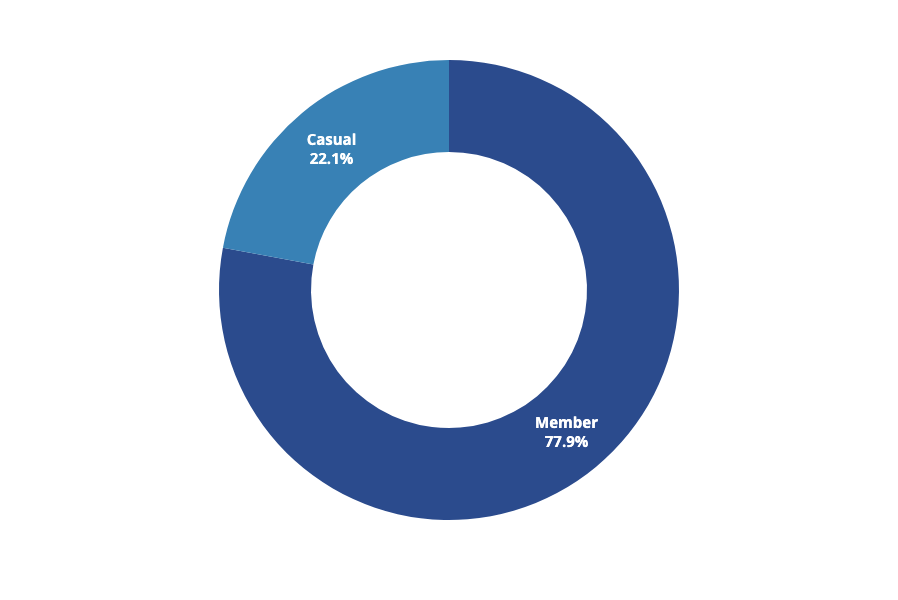

In [359]:
pie_fig = px.pie(pie_payment_data,
                 values = 'value',
                 names = 'member_casual',
                 color = 'member_casual',
                 color_discrete_sequence = ['#3881B5', '#2B4B8D'],
                 hole = 0.6,
                 labels = ['<b>Member</b>', '<b>Casual</b>'])

pie_fig.update_traces(textinfo = 'label+percent',
                      textfont_weight='bold',
                      textfont_size = 15,
                      showlegend = False)

pie_fig.update_layout(height = 600,
                      width = 600)

pie_fig.show()



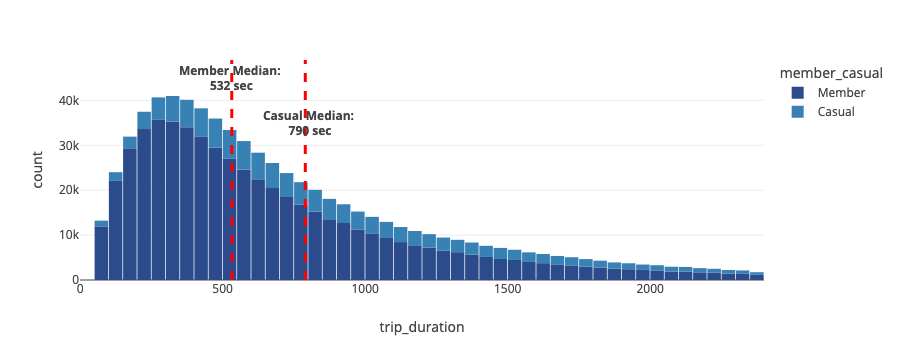

In [394]:
hist_fig = px.histogram(hist_duration_data,
                        x = 'trip_duration',
                        nbins = 50,
                        color = 'member_casual',
                        color_discrete_sequence = ['#2B4B8D', '#3881B5'])

hist_fig.update_layout(bargap = 0.05
)

member_median_data = hist_duration_data.loc[hist_duration_data['member_casual'] == 'Member']
casual_median_data = hist_duration_data.loc[hist_duration_data['member_casual'] == 'Casual']

member_median = np.median(member_median_data['trip_duration'])
casual_median = np.median(casual_median_data['trip_duration'])

hist_fig.add_vline(x = member_median,
                   line_width = 3,
                   line_dash = "dash",
                   line_color = "red")
hist_fig.add_annotation(x = member_median,
                        y = 45000,
                        text = f"<b>Member Median: <br>{member_median:.0f} sec</b>",
                        showarrow = False,
                        xshift = 0,
                        yshift = 0)

hist_fig.add_vline(x = casual_median,
                   line_width = 3,
                   line_dash = "dash",
                   line_color = "red")
hist_fig.add_annotation(x = casual_median,
                        y = 35000,
                        text = f"<b>Casual Median: <br>{casual_median:.0f} sec</b>",
                        showarrow = False,
                        xshift = 5,
                        yshift = 0)

hist_fig.show()